# Guidelines

# Imports

In [1]:
%reload_ext autoreload
%autoreload 2

import os
import math
import warnings
import missingno as msno
import numpy as np
import pandas as pd
import seaborn as sns
import folium
import datetime
from matplotlib import pyplot as plt
from pandas_profiling import ProfileReport
from datetime import datetime
from time import time
from folium import IFrame
from sklearn import set_config
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
from folium.plugins import HeatMap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.pipeline import Pipeline, make_pipeline 
from sklearn.manifold import TSNE
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn import preprocessing, decomposition, metrics
from hyperopt import hp, fmin, tpe, hp, anneal, Trials, STATUS_OK
from sklearn import metrics

from utils import *

pd.options.mode.chained_assignment = None  # default='warn'

%matplotlib inline

set_config(display='diagram', print_changed_only=False)
pd.set_option("display.max_columns", None)
pd.set_option('display.max_colwidth', None)
warnings.filterwarnings('ignore')
sns.set_theme(style="white")

#
init_notebook_mode(connected = True)

#
#%reload_ext pycodestyle_magic
#%flake8_on
#%flake8_off

# Download 

In [2]:
# Import .csv files and convert into a pandas dataframes
df_rfm = pd.read_csv("df_rfm.csv", sep=",",
                         encoding="utf-8", low_memory=False)
df_use_case_2 = pd.read_csv("df_geo.csv", sep=",", 
                            encoding="utf-8", low_memory=False)

df_use_case_3 = pd.read_csv("df_behavior.csv", sep=",",
                                     encoding="utf-8", low_memory=False)

df_use_case_4 = pd.read_csv("df_all.csv", sep=",",
                                     encoding="utf-8", low_memory=False)

# Set index
df_rfm = df_rfm.set_index('customer_unique_id')
df_use_case_2 = df_use_case_2.set_index('customer_unique_id')
df_use_case_3 = df_use_case_3.set_index('customer_unique_id')
df_use_case_4 = df_use_case_4.set_index('customer_unique_id')

## Use Case 1: RFM (Baseline)

In [3]:
'''#
df_rfm = variables_to_cast_as_sring_function(df_rfm, variables_to_cast_as_string_list)

# Check cast
df_rfm.info()'''

'#\ndf_rfm = variables_to_cast_as_sring_function(df_rfm, variables_to_cast_as_string_list)\n\n# Check cast\ndf_rfm.info()'

### Data

In [4]:
df_rfm.head()

,mean_monetary_value_rfm,count_frequency_rfm,last_recency_rfm
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,1340
0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,1343
0000f46a3911fa3c0805444483337064,86.22,1,1766
0000f6ccb0745a6a4b88665a16c9f078,43.62,1,1550
0004aac84e0df4da2b147fca70cf8255,196.89,1,1517


In [5]:
df_rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91233 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean_monetary_value_rfm  91233 non-null  float64
 1   count_frequency_rfm      91233 non-null  int64  
 2   last_recency_rfm         91233 non-null  int64  
dtypes: float64(1), int64(2)
memory usage: 2.8+ MB


In [6]:
df_rfm.describe()

,mean_monetary_value_rfm,count_frequency_rfm,last_recency_rfm
count,91233.000000,91233.000000,91233.000000
mean,157.716253,1.237633,1465.727730
std,215.752265,0.844651,152.615735
min,1.856818,1.000000,1229.000000
25%,60.750000,1.000000,1342.000000
50%,103.500000,1.000000,1447.000000
75%,174.970000,1.000000,1574.000000
max,13664.080000,75.000000,1924.000000


In [7]:
numerical_list_1 = ['count_frequency_rfm',
                    'mean_monetary_value_rfm',
                    'last_recency_rfm']

categorical_list_1 = []

X = df_rfm.copy()
X = prepare_data(X, numerical_list_1, categorical_list_1)

# Overview
info(X)
X.head()

3 columns
91231 rows
Rate of missing values in df : 0.0 %


,count_frequency_rfm,mean_monetary_value_rfm,last_recency_rfm
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,-0.292891,-0.074233,-0.823823
0000b849f77a49e4a4ce2b2a4ca5be3f,-0.292891,-0.617709,-0.804166
0000f46a3911fa3c0805444483337064,-0.292891,-0.338035,1.967516
0000f6ccb0745a6a4b88665a16c9f078,-0.292891,-0.539866,0.552189
0004aac84e0df4da2b147fca70cf8255,-0.292891,0.186300,0.335958


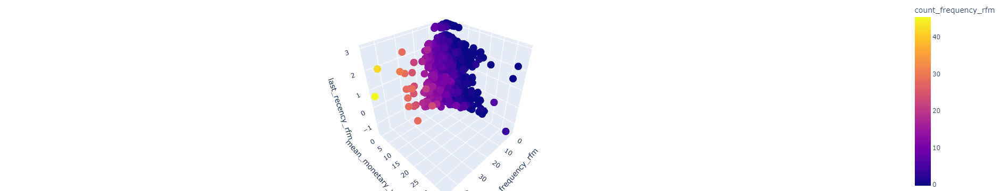

In [8]:
plot_3d_function(X, 
                 "", 
                 0, 
                 'count_frequency_rfm', 
                 'mean_monetary_value_rfm', 
                 'last_recency_rfm')

<AxesSubplot:>

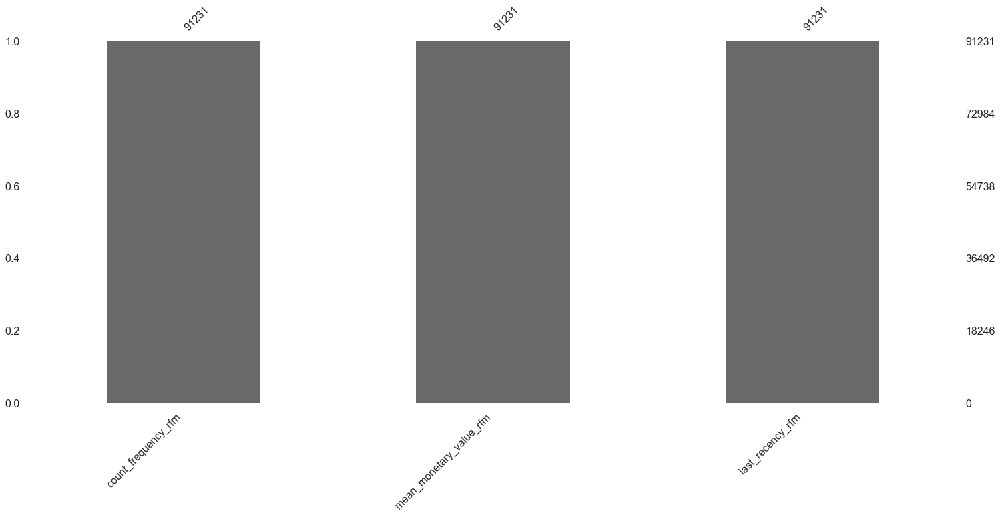

In [9]:
msno.bar(X)

### Algorithms

#### K-means

In [10]:
# Pre-Optimization

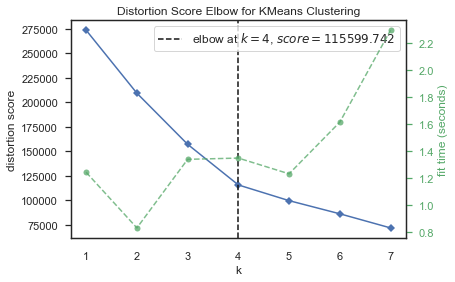

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [11]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,8))

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

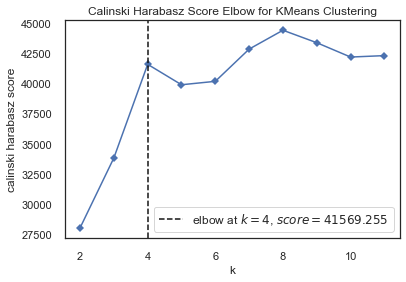

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [12]:
# Instantiate the clustering model and visualizer 
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,12), metric='calinski_harabasz', timings=False)

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data

In [13]:
'''# Instantiate the clustering model and visualizer 
model = KMeans(3)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data'''

'# Instantiate the clustering model and visualizer \nmodel = KMeans(3)\nvisualizer = SilhouetteVisualizer(model)\n\nvisualizer.fit(X)    # Fit the data to the visualizer\nvisualizer.poof()    # Draw/show/poof the data'

In [14]:
'''# Instantiate the clustering model and visualizer 
model = KMeans(4)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()    # Draw/show/poof the data'''

'# Instantiate the clustering model and visualizer \nmodel = KMeans(4)\nvisualizer = SilhouetteVisualizer(model)\n\nvisualizer.fit(X)    # Fit the data to the visualizer\nvisualizer.poof()    # Draw/show/poof the data'

In [15]:
#
from sklearn.neighbors import KNeighborsClassifier

pipe = schema_function(numerical_list_1, categorical_list_1, KMeans())
pipe

Pipeline(memory=None,
         steps=[('columntransformer',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('numerical',
                                                  Pipeline(memory=None,
                                                           steps=[('imputation_median',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                                 verbose=0)),
                                                                  ('scaler',
                                                                   StandardScale...
                                                                   OneHotEncoder(categories='auto',
                                                                                 drop=None,
                                                                                 dtype=<class 'numpy.float64'>,
                                                                                 handle_unknown='ignore',
                                                                                 sparse=True))],
                                                           verbose=False),
                                                  [])],
                                   verbose=False)),
                ('kmeans',
                 KMeans(algorithm='auto', copy_x=True, init='k-means++',
                        max_iter=300, n_clusters=8, n_init=10,
                        n_jobs='deprecated', precompute_distances='deprecated',
                        random_state=None, tol=0.0001, verbose=0))],
         verbose=False)

In [16]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_rfm, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), StandardScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_1,
                                        categorical_list=categorical_list_1,
                                        clustering_type=KMeans, 
                                        max_evals=6) 

#best_params_kmeans_1 = clustering.trials_clustering()



Silhouette Score: 0.3537594657190444
Calinski-Harabasz Score: 40542.37936843913
Davies-Bouldin Score: 1.8093421540528665
Running time: 2.059561



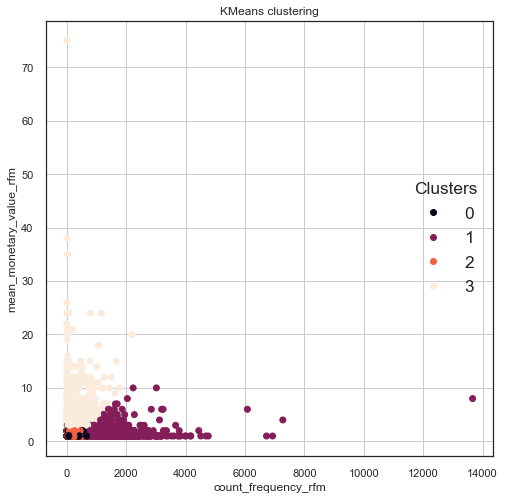

In [17]:
#
best_params_kmeans_1 = {'algorithm': 'full',
                        'init': 'k-means++',
                        'max_iter': 260,
                        'n_clusters': 4,
                        'n_init': 14,
                        'random_state': 1234}

#
results = clustering.executes_algo_function(best_params_kmeans_1)

#
labels_kmeans_1 = results[0]
running_time = results[1]
best_pipe = results[2]
after_transform_dataframe = results[3]

# Stats
res_kmeans_1 = stats_function(df_rfm, labels_kmeans_1, running_time)
#Silhouette Score: 0.34812133665451145
#Calinski-Harabasz Score: 30272.247933128256
#Davies-Bouldin Score: 2.8365645373875905
#Running time: 2.211171

# Plot
plot_function(df_rfm, 
              "KMeans", 
              labels_kmeans_1,
              'count_frequency_rfm',
              'mean_monetary_value_rfm',
              'last_recency_rfm')

#### DBSCAN

In [18]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_rfm, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_1,
                                        categorical_list=categorical_list_1,
                                        clustering_type=DBSCAN, 
                                        max_evals=1)

#best_params_dbscan_1 = clustering.trials_clustering()


'# Optimization\nclustering = ClusteringBestParamsSearch(dataframe=df_rfm, \n                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy=\'median\'), RobustScaler()],\n                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],\n                                        numerical_list=numerical_list_1,\n                                        categorical_list=categorical_list_1,\n                                        clustering_type=DBSCAN, \n                                        max_evals=1)\n\n#best_params_dbscan_1 = clustering.trials_clustering()'

In [19]:
# Best params
best_params_dbscan_1 = {'eps': 0.5,
                        'min_samples': 5,
                        'algorithm': 'auto',
                        'leaf_size': 30,
                       }

# Compute data
results = clustering.executes_algo_function(best_params_dbscan_1)

# Data
labels_dbscan_1 = results[0]
running_time = results[1]
best_pipe = results[2]
after_transform_dataframe = results[3]

# Stats
res_dbscan_1 = stats_function(df_rfm, labels_dbscan_1, running_time)
#Silhouette Score: -0.6081938016598446
#Calinski-Harabasz Score: 479.5685789327799
#Davies-Bouldin Score: 9.389626062197634
#Running time: 52.974978

# Plot clustering
plot_function(df_rfm, 
              "DBSCAN", 
              labels_dbscan_1,
              'mean_monetary_value_rfm',
              'count_frequency_rfm',
              'last_recency_rfm')


'# Best params\nbest_params_dbscan_1 = {\'eps\': 0.5,\n                        \'min_samples\': 5,\n                        \'algorithm\': \'auto\',\n                        \'leaf_size\': 30,\n                       }\n\n# Compute data\nresults = clustering.executes_algo_function(best_params_dbscan_1)\n\n# Data\nlabels_dbscan_1 = results[0]\nrunning_time = results[1]\nbest_pipe = results[2]\nafter_transform_dataframe = results[3]\n\n# Stats\nres_dbscan_1 = stats_function(df_rfm, labels_dbscan_1, running_time)\n#Silhouette Score: -0.6081938016598446\n#Calinski-Harabasz Score: 479.5685789327799\n#Davies-Bouldin Score: 9.389626062197634\n#Running time: 52.974978\n\n# Plot clustering\nplot_function(df_rfm, \n              "DBSCAN", \n              labels_dbscan_1,\n              \'mean_monetary_value_rfm\',\n              \'count_frequency_rfm\',\n              \'last_recency_rfm\')\n'

#### GaussianMixture

In [20]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_rfm, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_1,
                                        categorical_list=categorical_list_1,
                                        clustering_type=GaussianMixture, 
                                        max_evals=5)

#best_params_gm_1 = clustering.trials_clustering()



Silhouette Score: 0.46005751329602323
Calinski-Harabasz Score: 65180.927467191745
Davies-Bouldin Score: 0.6965631750344453
Running time: 0.70559



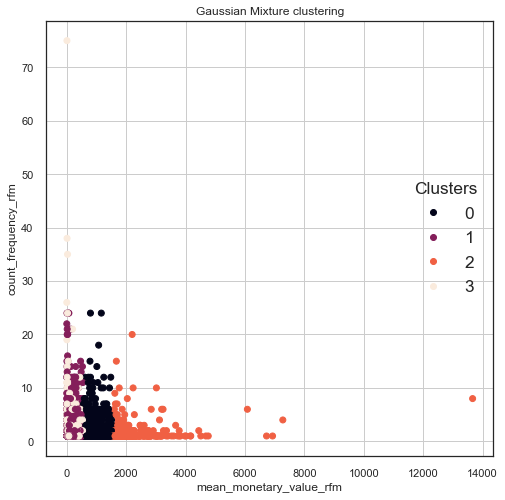

In [21]:
#
best_params_dbscan_1 = {'covariance_type': 'tied',
                        'init_params': 'kmeans',
                        'max_iter': 90,
                        'n_components': 4,
                        'n_init': 1,
                        'random_state': 1234,
                        'reg_covar': 1e-06,
                        'tol': 0.001}

#
results = clustering.executes_algo_function(best_params_dbscan_1)

#
labels_gm_1 = results[0]
running_time = results[1]
best_pipe = results[2]
after_transform_dataframe = results[3]

# Stats
res_gm_1 = stats_function(df_rfm, labels_gm_1, running_time)
#Silhouette Score: 0.7924816596472186
#Calinski-Harabasz Score: 48434.07105409358
#Davies-Bouldin Score: 0.5406933399696393
#Running time: 0.503093

# Plot
plot_function(df_rfm, 
              "Gaussian Mixture", 
              labels_gm_1,
              'mean_monetary_value_rfm',
              'count_frequency_rfm',
              'last_recency_rfm')


#### BIRCH

In [22]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_rfm, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_1,
                                        categorical_list=categorical_list_1,
                                        clustering_type=Birch, 
                                        max_evals=5)

#
#best_params_birch_1 = clustering.trials_clustering()



Silhouette Score: 0.7922187417965918
Calinski-Harabasz Score: 19962.024004856674
Davies-Bouldin Score: 0.4980880782086211
Running time: 3.689395



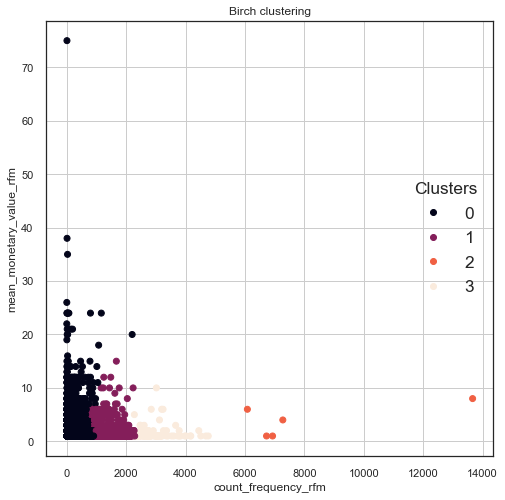

In [23]:
#
best_params_birch_1 = {'branching_factor': 50,
                       'n_clusters': 4,
                       'threshold': 0.4}

#
results = clustering.executes_algo_function(best_params_birch_1)

#
labels_birch_1 = results[0]
running_time = results[1]
best_pipe = results[2]
after_transform_dataframe = results[3]

# Stats
res_birch_1 = stats_function(df_rfm, labels_birch_1, running_time)
#Silhouette Score: 0.4298705286181879
#Calinski-Harabasz Score: 6422.625139653342
#Davies-Bouldin Score: 2.891701036790522
#Running time: 4.115705

# Plot
plot_function(df_rfm, 
              "Birch", 
              labels_birch_1,
              'count_frequency_rfm',
              'mean_monetary_value_rfm',
              'last_recency_rfm')


### Compare

In [24]:
#
clustering_name_list = ["KMeans",
                        "DBSCAN",
                        "GaussianMixture",
                        "Birch"]

#
output_algo_list = [labels_kmeans_1,
                    labels_dbscan_1,
                    labels_gm_1,
                    labels_birch_1]

#
compare_labels_function(df_rfm, 
                        clustering_name_list, 
                        output_algo_list,
                        'count_frequency_rfm', 
                        'mean_monetary_value_rfm', 
                        'last_recency_rfm'
                       )

NameError: name 'labels_dbscan_1' is not defined

### Scores

In [33]:
# lazy_predict_on_premise_function is defined in utils.py
table = sum_up_table_function('Silhouette', 
                              'descending',
                              kmeans=res_kmeans_1,
                              #dbscan=res_dbscan_1,
                              gaussian_mixture=res_gm_1,
                              birch=res_birch_1,    
                             )   

#table = (table[['Calinski-Harabasz','Davies-Bouldin Score','Running time']].style.highlight_min(color = 'green', axis = 0).highlight_max(color = 'red', axis = 0))

table 

,Silhouette,Calinski-Harabasz,Davies-Bouldin Score,Running time
birch,0.792219,19962.024005,0.498088,3.689395
gaussian_mixture,0.460058,65180.927467,0.696563,0.705590
kmeans,0.353759,40542.379368,1.809342,2.059561


### Radar 

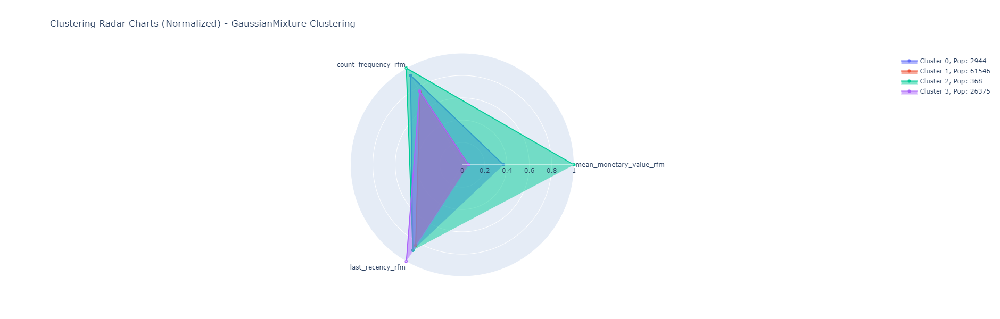

In [35]:
#
radar_chart_plot_function(df_rfm, 
                          "GaussianMixture",
                          labels_gm_1,
                          4,
                          1)


## Use Case 2: Geo

### Data

In [ ]:
df_use_case_2.head()

In [ ]:
df_use_case_2.info()

In [ ]:
df_use_case_2.describe()

In [ ]:
msno.bar(df_use_case_2)

### Algorithms

In [ ]:
numerical_list_2 = ['count_frequency_rfm',
                  'mean_monetary_value_rfm',
                  'last_recency_rfm']

categorical_list_2 = ['last_customer_state',
                    'last_geolocation_city',
                    'last_zip_code_prefix']


#### K-means

In [ ]:
# Pre-Optimization

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_2, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), LabelEncoder()],
                                        numerical_list=numerical_list_2,
                                        categorical_list=categorical_list_2,
                                        clustering_type=KMeans, 
                                        max_evals=5)

#best_params_kmeans_2 = clustering.trials_clustering()

In [ ]:
#
best_params_kmeans_2 = {'algorithm': 'full',
                        'init': 'k-means++',
                        'max_iter': 120,
                        'n_clusters': 5,
                        'n_init': 9,
                        'random_state': 1234}

#
results = clustering.executes_algo_function(best_params_kmeans_2)

#
labels_kmeans_2 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_kmeans_2 = stats_function(scaled_dataframe_array, labels_kmeans_2, running_time)
#Silhouette Score: 0.35086768846467
#Calinski-Harabasz Score: 30507.42453145062
#Davies-Bouldin Score: 0.9340123996363102
#Running time: 1.634369

# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# Plot
plot_3d_function(X2_projected,
                 "KMeans", 
                 labels_kmeans_2,
                 "PC1",
                 "PC2",
                 "PC3")

#### DBSCAN

In [ ]:
# Pre-Optimization

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_2, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_2,
                                        categorical_list=categorical_list_2,
                                        clustering_type=DBSCAN, 
                                        max_evals=3)

#best_params_dbscan_2 = clustering.trials_clustering()


In [ ]:
#
best_params_dbscan_2 = {'eps': 0.5,
                        'min_samples': 5,
                        'algorithm': 'auto',
                        'leaf_size': 30}

#
results = clustering.executes_algo_function(best_params_dbscan_2)

#
labels_dbscan_2 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_dbscan_2 = stats_function(scaled_dataframe_array, labels_dbscan_2, running_time)
# Silhouette Score: 0.08180829866710625
# Calinski-Harabasz Score: 820.2929546580935
# Davies-Bouldin Score: 1.5743629570726156
# Running time: 30.422378

# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)



In [ ]:
#
plot_3d_function(X2_projected,
                 "DBSCAN",
                 labels_dbscan_2,
                 'PC1',
                 'PC2',
                 'PC3')

#### GaussianMixture

In [ ]:
# Pre-Optimization

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_2, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_2,
                                        categorical_list=categorical_list_2,
                                        clustering_type=GaussianMixture, 
                                        max_evals=6)

#best_params_gm_2 = clustering.trials_clustering()

In [ ]:
# 
best_params_gm_2 = {'covariance_type': 'tied', 
                    'init_params': 'kmeans', 
                    'max_iter': 90, 
                    'n_components': 4, 
                    'n_init': 1, 
                    'random_state': 1234, 
                    'reg_covar': 1e-06, 
                    'tol': 0.001}

#
results = clustering.executes_algo_function(best_params_gm_2)

#
labels_gm_2 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_gm_2 = stats_function(scaled_dataframe_array, labels_gm_2, running_time)
#Silhouette Score: 0.352315729429673
#Calinski-Harabasz Score: 22469.202441437777
#Davies-Bouldin Score: 1.073992639343989
#Running time: 0.892613

# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# Plot
plot_3d_function(X2_projected,
                 "GaussianMixture", 
                 labels_gm_2,
                 "PC1",
                 "PC2",
                 "PC3")

#### BIRCH

In [ ]:
# Pre-Optimization

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_2, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_2,
                                        categorical_list=categorical_list_2,
                                        clustering_type=Birch, 
                                        max_evals=6)

#best_params_birch_2 = clustering.trials_clustering()

In [ ]:
# 
best_params_birch_2 = {'branching_factor': 70,
                       'n_clusters': 3,
                       'threshold': 0.4}
#
results = clustering.executes_algo_function(best_params_birch_2)

#
labels_birch_2 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_birch_2 = stats_function(scaled_dataframe_array, labels_birch_2, running_time)
#Silhouette Score: 0.7780831323699176
#Calinski-Harabasz Score: 8633.856510030326
#Davies-Bouldin Score: 0.5355977990713251
#Running time: 5.242292

# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# Plot
plot_3d_function(X2_projected,
                 "Birch", 
                 labels_birch_2,
                 "PC1",
                 "PC2",
                 "PC3")

### Scores

In [ ]:
# lazy_predict_on_premise_function is defined in utils.py
table_2 = sum_up_table_function('Silhouette', 
                              'descending',
                              kmeans=res_kmeans_2,
                              dbscan=res_dbscan_2,
                              gaussian_mixture=res_gm_2,
                              birch=res_birch_2,  
                            )


table_2 = table_2.style.highlight_min(color = 'red', axis = 0).highlight_max(color = 'green', axis = 0)
table_2


### Radar

In [ ]:
#
radar_chart_plot_function(df_use_case_2, 
                          "Birch",
                          labels_gm_2,
                          3,
                          1)


## Use case 3: Behavior

### Data

In [ ]:
df_use_case_3.head()

In [ ]:
df_use_case_3.info()

In [ ]:
df_use_case_3.describe()

In [ ]:
msno.bar(df_use_case_3)

### Algorithms

In [ ]:
numerical_list_3 = ['mean_monetary_value_rfm',
                  'count_frequency_rfm',
                  'last_recency_rfm',
                  'mean_review_score']

categorical_list_3 = ['last_payment_type',
                    'last_product_category_name_english']


#### K-means 

In [ ]:
# Pre-Optimization

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_3, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_3,
                                        categorical_list=categorical_list_3,
                                        clustering_type=KMeans, 
                                        max_evals=6)


#best_params_kmeans_3 = clustering.trials_clustering()

In [ ]:
#
best_params_kmeans_3 = {'algorithm': 'elkan',
                        'init': 'k-means++',
                        'max_iter': 120,
                        'n_clusters': 2,
                        'n_init': 5,
                        'random_state': 1234}

#
results = clustering.executes_algo_function(best_params_kmeans_3)

#
labels_kmeans_3 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_kmeans_3 = stats_function(scaled_dataframe_array, labels_kmeans_3, running_time)
#Silhouette Score: 0.3842340072359923
#Calinski-Harabasz Score: 23210.447911365296
#Davies-Bouldin Score: 1.3559319473851386
#Running time: 0.400172
    
# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# Plot
plot_3d_function(X2_projected,
                 "KMeans", 
                 labels_kmeans_3,
                 "PC1",
                 "PC2",
                 "PC3")

#### DBSCAN

In [ ]:
# Pre-Optimization

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_3, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_3,
                                        categorical_list=categorical_list_3,
                                        clustering_type=DBSCAN, 
                                        max_evals=3)

#best_params_dbscan_3 = clustering.trials_clustering()

In [ ]:
#
best_params_dbscan_3 = {'eps': 0.5,
                         'min_samples': 5,
                         'algorithm': 'auto',
                         'leaf_size': 30}

#
results = clustering.executes_algo_function(best_params_dbscan_3)

#
labels_dbscan_3 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_dbscan_3 = stats_function(scaled_dataframe_array, labels_dbscan_3, running_time)
#Silhouette Score: 0.08783624719313873
#Calinski-Harabasz Score: 1366.6330030659176
#Davies-Bouldin Score: 1.709605343689468
#Running time: 26.941483

# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# Plot
plot_3d_function(X2_projected,
                 "DBSCAN", 
                 labels_dbscan_3,
                 "PC1",
                 "PC2",
                 "PC3")

#### GaussianMixture

In [ ]:
# Pre-Optimization

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_3, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_3,
                                        categorical_list=categorical_list_3,
                                        clustering_type=GaussianMixture, 
                                        max_evals=6)

#best_params_gm_3 = clustering.trials_clustering()

In [ ]:
#
best_params_gm_3 = {'covariance_type': 'tied',
                    'init_params': 'kmeans',
                    'max_iter': 90,
                    'n_components': 2,
                    'n_init': 1,
                    'random_state': 1234,
                    'reg_covar': 1e-06,
                    'tol': 0.001}

#
results = clustering.executes_algo_function(best_params_gm_3)

#
labels_gm_3 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_gm_3 = stats_function(scaled_dataframe_array, labels_gm_3, running_time)


# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# Plot
plot_3d_function(X2_projected,
                 "GaussianMixture", 
                 labels_gm_3,
                 "PC1",
                 "PC2",
                 "PC3")

#### BIRCH

In [ ]:
# Pre-Optimization

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_3, 
                                        numerical_transformers=[SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()],
                                        categorical_transformers=[SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")],
                                        numerical_list=numerical_list_3,
                                        categorical_list=categorical_list_3,
                                        clustering_type=Birch, 
                                        max_evals=6)

best_params_birch_3 = clustering.trials_clustering()

In [ ]:
#
best_params_birchs_3 = {'branching_factor': 50,
                        'n_clusters': 3,
                        'threshold': 0.5}
#
results = clustering.executes_algo_function(best_params_birchs_3)

#
labels_birch_3 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_birch_3 = stats_function(scaled_dataframe_array, labels_birch_3, running_time)

    
# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# TSNE
#X2_projected = tsne_scaled_function(scaled_dataframe_array)

# Plot
plot_3d_function(X2_projected,
                 "Birch", 
                 labels_birch_3,
                 "PC1",
                 "PC2",
                 "PC3")

### Scores

In [ ]:
# lazy_predict_on_premise_function is defined in utils.py
table_3 = sum_up_table_function('Silhouette', 
                              'descending',
                              kmeans=res_kmeans_3,
                              dbscan=res_dbscan_3,
                              gaussian_mixture=res_gm_3,
                              birch=res_birch_3,  
                            )  

table_3 = table_3.style.highlight_min(color = 'red', axis = 0).highlight_max(color = 'green', axis = 0)
table_3  

### Radar

In [ ]:
#
radar_chart_plot_function(df_use_case_3, 
                          "Birch",
                          labels_birch_3,
                          2,
                          3)


## Use Case 4: RFM, Geo, Behavior

### Data

In [ ]:
df_use_case_4.head()

In [ ]:
df_use_case_4.info()

In [ ]:
df_use_case_4.describe()

In [ ]:
msno.bar(df_use_case_4)

### Algorithms

In [ ]:
numerical_list_4 = ['mean_monetary_value_rfm',
                  'count_frequency_rfm',
                  'last_recency_rfm',
                  'mean_review_score']

categorical_list_4 = ['last_payment_type',
                    'last_product_category_name_english',
                    'last_customer_state',
                    'last_geolocation_city',
                    'last_zip_code_prefix']



#### K-means

In [ ]:
# Pre-Optimization

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_4, 
                                        numerical_transformers=(SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()),
                                        categorical_transformers=(SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")),
                                        numerical_list=numerical_list_4,
                                        categorical_list=categorical_list_4,
                                        clustering_type=KMeans, 
                                        max_evals=6)

#best_params_kmeans_4 = clustering.trials_clustering()

In [ ]:
#
best_params_kmeans_4 = {'algorithm': 'full',
                        'init': 'k-means++',
                        'max_iter': 260,
                        'n_clusters': 5,
                        'n_init': 14,
                        'random_state': 1234}

#
results = clustering.executes_algo_function(best_params_kmeans_4)

#
labels_kmeans_4 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_kmeans_4 = stats_function(scaled_dataframe_array, labels_kmeans_4, running_time)
#Silhouette Score: 0.2949091615892172
#Calinski-Harabasz Score: 22078.725435064494
#Davies-Bouldin Score: 1.1047178548192753
#Running time: 2.793905

# PCA
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# TSNE
#scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
#X2_projected = tsne_scaled_function(scaled_dataframe, 3)

# Plot
plot_3d_function(X2_projected,
                 "KMeans", 
                 labels_kmeans_4,
                 "PC1",
                 "PC2",
                 "PC3")

#### DBSCAN

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_4, 
                                        numerical_transformers=(SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()),
                                        categorical_transformers=(SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")),
                                        numerical_list=numerical_list_4,
                                        categorical_list=categorical_list_4,
                                        clustering_type=DBSCAN, 
                                        max_evals=3)

#best_params_dbscan_4 = clustering.trials_clustering()

In [ ]:
#
best_params_dbscan_4 = {'eps': 0.5,
                        'min_samples': 5,
                        'algorithm': 'auto',
                        'leaf_size': 30}

#
results = clustering.executes_algo_function(best_params_dbscan_4)

#
labels_dbscan_4 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_dbscan_4 = stats_function(scaled_dataframe_array, labels_dbscan_4, running_time)
#Silhouette Score: -0.015011858269491946
#Calinski-Harabasz Score: 647.40328266532
#Davies-Bouldin Score: 1.7227886334720552
#Running time: 31.237176

# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)


# Plot
plot_3d_function(X2_projected,
                 "DBSCAN", 
                 labels_dbscan_4,
                 "PC1",
                 "PC2",
                 "PC3")

#### GaussianMixture

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_4, 
                                        numerical_transformers=(SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()),
                                        categorical_transformers=(SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")),
                                        numerical_list=numerical_list_4,
                                        categorical_list=categorical_list_4,
                                        clustering_type=GaussianMixture, 
                                        max_evals=6)

#best_params_gm_4 = clustering.trials_clustering()

In [ ]:
#
best_params_gm_4 = {'covariance_type': 'tied',
                    'init_params': 'kmeans',
                    'max_iter': 90,
                    'n_components': 2,
                    'n_init': 1,
                    'random_state': 1234,
                    'reg_covar': 1e-06,
                    'tol': 0.001}

#
results = clustering.executes_algo_function(best_params_gm_4)

#
labels_gm_4 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_gm_4 = stats_function(scaled_dataframe_array, labels_gm_4, running_time)
#Silhouette Score: 0.37621934835510124
#Calinski-Harabasz Score: 16661.85167098366
#Davies-Bouldin Score: 1.2834024204005523
#Running time: 0.707092


# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# Plot
plot_3d_function(X2_projected,
                 "GaussianMixture", 
                 labels_gm_4,
                 "PC1",
                 "PC2",
                 "PC3")

#### BIRCH

In [ ]:
# Optimization
clustering = ClusteringBestParamsSearch(dataframe=df_use_case_4, 
                                        numerical_transformers=(SimpleImputer(missing_values=np.nan, strategy='median'), RobustScaler()),
                                        categorical_transformers=(SimpleImputer(fill_value="missing", strategy="constant"), OneHotEncoder(handle_unknown="ignore")),
                                        numerical_list=numerical_list_4,
                                        categorical_list=categorical_list_4,
                                        clustering_type=Birch, 
                                        max_evals=6)

#best_params_birch_4 = clustering.trials_clustering()

In [ ]:
#
best_params_birch_4 = {'branching_factor': 50,
                       'n_clusters': 3,
                       'threshold': 0.4}

#
results = clustering.executes_algo_function(best_params_birch_4)

#
labels_birch_4 = results[0]
running_time = results[1]
best_pipe = results[2]
scaled_dataframe_array = results[3]

# Stats
res_birch_4 = stats_function(scaled_dataframe_array, labels_birch_4, running_time)
#Silhouette Score: 0.9264615967361854
#Calinski-Harabasz Score: 6473.641578302618
# Davies-Bouldin Score: 0.307737578334865
#running time: 8.651078

# PCR
scaled_dataframe = pd.DataFrame(scaled_dataframe_array)
X2_projected = pca_scaled_function(scaled_dataframe, 3)

# Plot
plot_3d_function(X2_projected,
                 "KMeans", 
                 labels_birch_4,
                 "PC1",
                 "PC2",
                 "PC3")

### Scores

In [ ]:
# lazy_predict_on_premise_function is defined in utils.py
table_4 = sum_up_table_function('Silhouette', 
                              'descending',
                              kmeans=res_kmeans_4,
                              dbscan=res_dbscan_4,
                              gaussian_mixture=res_gm_4,
                              birch=res_birch_4,             
                            )  
  
table_4 = table_4.style.highlight_min(color = 'red', axis = 0).highlight_max(color = 'green', axis = 0)
table_4  

### Radar

In [ ]:
#
radar_chart_plot_function(df_use_case_4, 
                          "Birch",
                          labels_birch_4,
                          3,
                          4)
